In [1]:
%load_ext autoreload
%autoreload 2

import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

#### Let's solve the clustering problem for football players based on FIFA statistics that have been scrapped from the site sofifa.com. 
##### The dataset contains information about players: personal data and game statistics

In [2]:
url_link = 'https://query.data.world/s/ev6nxblbbfmhftigog5ffvexz4uzyf?dws=00000' # fifa stats
df = pd.read_csv(url_link, sep=',')
df.head(7)

,id,name,full_name,birth_date,age,height_cm,weight_kgs,positions,nationality,overall_rating,potential,value_euro,wage_euro,preferred_foot,international_reputation(1-5),weak_foot(1-5),skill_moves(1-5),work_rate,body_type,release_clause_euro,club_team,club_rating,club_position,club_jersey_number,club_join_date,contract_end_year,national_team,national_rating,national_team_position,national_jersey_number,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,freekick_accuracy,long_passing,ball_control,acceleration,sprint_speed,agility,reactions,balance,shot_power,jumping,stamina,strength,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle,GK_diving,GK_handling,GK_kicking,GK_positioning,GK_reflexes,tags,traits,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB
0,158023,L. Messi,Lionel Andrés Messi Cuccittini,1987-06-24,31,170.18,72.1,"CF,RW,ST",Argentina,94,94,110500000.0,565000.0,Left,5,4,4,Medium/ Low,Messi,226500000.0,FC Barcelona,86.0,RW,10.0,2004-07-01,2021,Argentina,82.0,RF,10.0,86,95,70,92,86,97,93,94,89,96,91,86,93,95,95,85,68,72,66,94,48,22,94,94,75,96,33,28,26,6,11,15,14,8,"#Dribbler,#Distance Shooter,#Crosser,#FK Speci...","Finesse Shot,Long Shot Taker (CPU AI Only),Spe...",89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,91+2,85+2,85+2,85+2,91+2,64+2,61+2,61+2,61+2,64+2,59+2,48+2,48+2,48+2,59+2
1,190460,C. Eriksen,Christian Dannemann Eriksen,1992-02-14,27,154.94,76.2,"CAM,RM,CM",Denmark,88,89,69500000.0,205000.0,Right,3,5,4,High/ Medium,Lean,133800000.0,Tottenham Hotspur,83.0,LCM,23.0,2013-08-30,2020,Denmark,78.0,CAM,10.0,88,81,52,91,80,84,86,87,89,91,76,73,80,88,81,84,50,92,58,89,46,56,84,91,67,88,59,57,22,9,14,7,7,6,"#Playmaker ,#Crosser,#FK Specialist,#Complete...","Flair,Long Shot Taker (CPU AI Only),Playmaker ...",79+3,79+3,79+3,85+3,84+3,84+3,84+3,85+3,86+3,86+3,86+3,86+3,85+3,85+3,85+3,86+3,71+3,71+3,71+3,71+3,71+3,66+3,57+3,57+3,57+3,66+3
2,195864,P. Pogba,Paul Pogba,1993-03-15,25,190.50,83.9,"CM,CAM",France,88,91,73000000.0,255000.0,Right,4,4,5,High/ Medium,Normal,144200000.0,Manchester United,82.0,LCM,6.0,2016-08-09,2021,France,84.0,RDM,6.0,80,75,75,86,85,87,85,82,90,90,71,79,76,82,66,90,83,88,87,82,78,64,82,88,82,87,63,67,67,5,6,2,4,3,"#Dribbler,#Playmaker ,#Strength,#Complete Mid...","Flair,Long Passer (CPU AI Only),Long Shot Take...",81+3,81+3,81+3,82+3,83+3,83+3,83+3,82+3,84+3,84+3,84+3,83+3,84+3,84+3,84+3,83+3,76+3,77+3,77+3,77+3,76+3,74+3,72+3,72+3,72+3,74+3
3,198219,L. Insigne,Lorenzo Insigne,1991-06-04,27,162.56,59.0,"LW,ST",Italy,88,88,62000000.0,165000.0,Right,3,4,4,High/ Medium,Normal,105400000.0,Napoli,82.0,LS,24.0,2010-07-01,2022,Italy,83.0,LW,10.0,86,77,56,85,74,90,87,77,78,93,94,86,94,83,93,75,53,75,44,84,34,26,83,87,61,83,51,24,22,8,4,14,9,10,"#Speedster,#Dribbler,#Crosser,#Acrobat","Finesse Shot,Long Shot Taker (CPU AI Only),Spe...",78+3,78+3,78+3,86+3,85+3,85+3,85+3,86+3,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,63+3,58+3,58+3,58+3,63+3,58+3,44+3,44+3,44+3,58+3
4,201024,K. Koulibaly,Kalidou Koulibaly,1991-06-20,27,187.96,88.9,CB,Senegal,88,91,60000000.0,135000.0,Right,3,3,2,High/ High,Normal,106500000.0,Napoli,82.0,LCB,26.0,2014-07-01,2021,NaN,NaN,NaN,NaN,30,22,83,68,14,69,28,28,60,63,70,75,50,82,40,55,81,75,94,15,87,88,24,49,33,80,91,88,87,7,11,7,13,5,"#Tackling ,#Tactician ,#Strength,#Complete Def...",Power Header,53+3,53+3,53+3,53+3,54+3,54+3,54+3,53+3,55+3,55+3,55+3,57+3,61+3,61+3,61+3,57+3,73+3,77+3,77+3,77+3,73+3,76+3,85+3,85+3,85+3,76+3
5,203376,V. van Dijk,Virgil van Dijk,1991-07-08,27,193.04,92.1,CB,Netherlands,88,90,59500000.0,215000.0,Right,3,3,2,Medium/ Medium,Normal,114500000.0,Liverpool,83.0,LCB,4.0,2018-01-01,2023,Netherlands,81.0,LCB,4.0,53,52,83,79,45,70,60,70,81,76,74,77,61,87,49,81,88,75,92,64,82,88,41,60,62,87,90,89,84,13,10,13,11,11,"#Tactician ,#Strength","Injury Free,Leadership,Power Header",68+3,68+3,68+3,66+3,67+3,67+3,67+3,66+3,68+3,68+3,68+3,68

In [3]:
pd.DataFrame(df.dtypes, columns=['type'])

,type
id,int64
name,object
full_name,object
birth_date,object
age,int64
height_cm,float64
weight_kgs,float64
positions,object
nationality,object
overall_rating,int64


#### Let's remove the `id`, `contract_end_year`, `club_jersey_number` columns, since it does not contain information for clustering, and also remove `birth_date` column, because we have an `age` column, it will be enough

In [4]:
df = df.drop(['id', 'birth_date', 'club_jersey_number', 'contract_end_year', 'club_join_date'], axis=1)
df.head(3)

,name,full_name,age,height_cm,weight_kgs,positions,nationality,overall_rating,potential,value_euro,wage_euro,preferred_foot,international_reputation(1-5),weak_foot(1-5),skill_moves(1-5),work_rate,body_type,release_clause_euro,club_team,club_rating,club_position,national_team,national_rating,national_team_position,national_jersey_number,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,freekick_accuracy,long_passing,ball_control,acceleration,sprint_speed,agility,reactions,balance,shot_power,jumping,stamina,strength,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle,GK_diving,GK_handling,GK_kicking,GK_positioning,GK_reflexes,tags,traits,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB
0,L. Messi,Lionel Andrés Messi Cuccittini,31,170.18,72.1,"CF,RW,ST",Argentina,94,94,110500000.0,565000.0,Left,5,4,4,Medium/ Low,Messi,226500000.0,FC Barcelona,86.0,RW,Argentina,82.0,RF,10.0,86,95,70,92,86,97,93,94,89,96,91,86,93,95,95,85,68,72,66,94,48,22,94,94,75,96,33,28,26,6,11,15,14,8,"#Dribbler,#Distance Shooter,#Crosser,#FK Speci...","Finesse Shot,Long Shot Taker (CPU AI Only),Spe...",89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,91+2,85+2,85+2,85+2,91+2,64+2,61+2,61+2,61+2,64+2,59+2,48+2,48+2,48+2,59+2
1,C. Eriksen,Christian Dannemann Eriksen,27,154.94,76.2,"CAM,RM,CM",Denmark,88,89,69500000.0,205000.0,Right,3,5,4,High/ Medium,Lean,133800000.0,Tottenham Hotspur,83.0,LCM,Denmark,78.0,CAM,10.0,88,81,52,91,80,84,86,87,89,91,76,73,80,88,81,84,50,92,58,89,46,56,84,91,67,88,59,57,22,9,14,7,7,6,"#Playmaker ,#Crosser,#FK Specialist,#Complete...","Flair,Long Shot Taker (CPU AI Only),Playmaker ...",79+3,79+3,79+3,85+3,84+3,84+3,84+3,85+3,86+3,86+3,86+3,86+3,85+3,85+3,85+3,86+3,71+3,71+3,71+3,71+3,71+3,66+3,57+3,57+3,57+3,66+3
2,P. Pogba,Paul Pogba,25,190.50,83.9,"CM,CAM",France,88,91,73000000.0,255000.0,Right,4,4,5,High/ Medium,Normal,144200000.0,Manchester United,82.0,LCM,France,84.0,RDM,6.0,80,75,75,86,85,87,85,82,90,90,71,79,76,82,66,90,83,88,87,82,78,64,82,88,82,87,63,67,67,5,6,2,4,3,"#Dribbler,#Playmaker ,#Strength,#Complete Mid...","Flair,Long Passer (CPU AI Only),Long Shot Take...",81+3,81+3,81+3,82+3,83+3,83+3,83+3,82+3,84+3,84+3,84+3,83+3,84+3,84+3,84+3,83+3,76+3,77+3,77+3,77+3,76+3,74+3,72+3,72+3,72+3,74+3


#### I am going to analyze gaps in dataframe

In [5]:
def display_count_stats(df):
    df_count = pd.DataFrame(df.count(), columns=['cnt']).reset_index()
    with pd.option_context('display.max_colwidth', None):
      display(df_count.groupby('cnt').agg({'index': lambda val: ', '.join(val)}))
display_count_stats(df)

,index
cnt,
857,"national_team, national_rating, national_team_position, national_jersey_number"
1417,tags
8137,traits
15889,"LS, ST, RS, LW, LF, CF, RF, RW, LAM, CAM, RAM, LM, LCM, CM, RCM, RM, LWB, LDM, CDM, RDM, RWB, LB, LCB, CB, RCB, RB"
16117,release_clause_euro
17699,value_euro
17708,wage_euro
17940,"club_team, club_rating, club_position"
17954,"name, full_name, age, height_cm, weight_kgs, positions, nationality, overall_rating, potential, preferred_foot, international_reputation(1-5), weak_foot(1-5), skill_moves(1-5), work_rate, body_type, crossing, finishing, heading_accuracy, short_passing, volleys, dribbling, curve, freekick_accuracy, long_passing, ball_control, acceleration, sprint_speed, agility, reactions, balance, shot_power, jumping, stamina, strength, long_shots, aggression, interceptions, positioning, vision, penalties, composure, marking, standing_tackle, sliding_tackle, GK_diving, GK_handling, GK_kicking, GK_positioning, GK_reflexes"


In [6]:
df[['release_clause_euro', 'value_euro', 'wage_euro']].corr()

,release_clause_euro,value_euro,wage_euro
release_clause_euro,1.000000,0.994318,0.856239
value_euro,0.994318,1.000000,0.856466
wage_euro,0.856239,0.856466,1.000000


#### As we can see, there are often gaps in the `release_clause_euro`, `value_euro`, `wage_euro`, while there is a high correlation between them, so we will leave only one value

In [7]:
df = df.drop(['release_clause_euro', 'wage_euro'], axis=1)
display_count_stats(df)

,index
cnt,
857,"national_team, national_rating, national_team_position, national_jersey_number"
1417,tags
8137,traits
15889,"LS, ST, RS, LW, LF, CF, RF, RW, LAM, CAM, RAM, LM, LCM, CM, RCM, RM, LWB, LDM, CDM, RDM, RWB, LB, LCB, CB, RCB, RB"
17699,value_euro
17940,"club_team, club_rating, club_position"
17954,"name, full_name, age, height_cm, weight_kgs, positions, nationality, overall_rating, potential, preferred_foot, international_reputation(1-5), weak_foot(1-5), skill_moves(1-5), work_rate, body_type, crossing, finishing, heading_accuracy, short_passing, volleys, dribbling, curve, freekick_accuracy, long_passing, ball_control, acceleration, sprint_speed, agility, reactions, balance, shot_power, jumping, stamina, strength, long_shots, aggression, interceptions, positioning, vision, penalties, composure, marking, standing_tackle, sliding_tackle, GK_diving, GK_handling, GK_kicking, GK_positioning, GK_reflexes"


#### Also, there are often gaps in the national team stats. We will also remove these columns since the national team of the player is not so important to us for clustering

In [8]:
df = df.drop(['national_team', 'national_rating', 'national_team_position', 'national_jersey_number'], axis=1)

#### I plan to explore FIFA stats columns: LS, ST, RS... There is a rating "+" number in these columns. It indicates what boost/downgrade they get to their Overall rating due to level of morale & form for the position they are playing in. Let's analyze these values

In [9]:
stats_columns = 'LS, ST, RS, LW, LF, CF, RF, RW, LAM, CAM, RAM, LM, LCM, CM, RCM, RM, LWB, LDM, CDM, RDM, RWB, LB, LCB, CB, RCB, RB'.split(', ')

values = set()
for column in stats_columns:
    for value in df[column]:
        if pd.isna(value):
            continue
        values.add(value.split('+')[1])
values

{'2', '3', '4', '5'}

#### As we can see, these values are mostly small, so we can exclude them from the analysis

In [10]:
for column in stats_columns:
    df[column] = df[column].apply(
        lambda val: None if pd.isna(val) else int(val[:val.find('+')])
    )
df.head(3)

,name,full_name,age,height_cm,weight_kgs,positions,nationality,overall_rating,potential,value_euro,preferred_foot,international_reputation(1-5),weak_foot(1-5),skill_moves(1-5),work_rate,body_type,club_team,club_rating,club_position,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,freekick_accuracy,long_passing,ball_control,acceleration,sprint_speed,agility,reactions,balance,shot_power,jumping,stamina,strength,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle,GK_diving,GK_handling,GK_kicking,GK_positioning,GK_reflexes,tags,traits,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB
0,L. Messi,Lionel Andrés Messi Cuccittini,31,170.18,72.1,"CF,RW,ST",Argentina,94,94,110500000.0,Left,5,4,4,Medium/ Low,Messi,FC Barcelona,86.0,RW,86,95,70,92,86,97,93,94,89,96,91,86,93,95,95,85,68,72,66,94,48,22,94,94,75,96,33,28,26,6,11,15,14,8,"#Dribbler,#Distance Shooter,#Crosser,#FK Speci...","Finesse Shot,Long Shot Taker (CPU AI Only),Spe...",89.0,89.0,89.0,93.0,93.0,93.0,93.0,93.0,93.0,93.0,93.0,91.0,85.0,85.0,85.0,91.0,64.0,61.0,61.0,61.0,64.0,59.0,48.0,48.0,48.0,59.0
1,C. Eriksen,Christian Dannemann Eriksen,27,154.94,76.2,"CAM,RM,CM",Denmark,88,89,69500000.0,Right,3,5,4,High/ Medium,Lean,Tottenham Hotspur,83.0,LCM,88,81,52,91,80,84,86,87,89,91,76,73,80,88,81,84,50,92,58,89,46,56,84,91,67,88,59,57,22,9,14,7,7,6,"#Playmaker ,#Crosser,#FK Specialist,#Complete...","Flair,Long Shot Taker (CPU AI Only),Playmaker ...",79.0,79.0,79.0,85.0,84.0,84.0,84.0,85.0,86.0,86.0,86.0,86.0,85.0,85.0,85.0,86.0,71.0,71.0,71.0,71.0,71.0,66.0,57.0,57.0,57.0,66.0
2,P. Pogba,Paul Pogba,25,190.50,83.9,"CM,CAM",France,88,91,73000000.0,Right,4,4,5,High/ Medium,Normal,Manchester United,82.0,LCM,80,75,75,86,85,87,85,82,90,90,71,79,76,82,66,90,83,88,87,82,78,64,82,88,82,87,63,67,67,5,6,2,4,3,"#Dribbler,#Playmaker ,#Strength,#Complete Mid...","Flair,Long Passer (CPU AI Only),Long Shot Take...",81.0,81.0,81.0,82.0,83.0,83.0,83.0,82.0,84.0,84.0,84.0,83.0,84.0,84.0,84.0,83.0,76.0,77.0,77.0,77.0,76.0,74.0,72.0,72.0,72.0,74.0


#### Columns `positions`, `tags`, `traits` should naturally be converted using one-hot encoding

In [11]:
import re

oh_columns = set()

for column in ['positions', 'tags', 'traits']:
    df[column] = df[column].fillna('')

    values = set()
    for value in df[column]:
        if not value:
            continue
        values = values.union(value.split(','))

    for tag in values:
        df[f'is_{tag}'] = df[column].apply(
            lambda val: int(bool(re.search(re.escape(tag) + r'(,|$)', val)))
        )
        oh_columns.add(f'is_{tag}')

In [12]:
df.sample(5)

,name,full_name,age,height_cm,weight_kgs,positions,nationality,overall_rating,potential,value_euro,preferred_foot,international_reputation(1-5),weak_foot(1-5),skill_moves(1-5),work_rate,body_type,club_team,club_rating,club_position,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,freekick_accuracy,long_passing,ball_control,acceleration,sprint_speed,agility,reactions,balance,shot_power,jumping,stamina,strength,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle,GK_diving,GK_handling,GK_kicking,GK_positioning,GK_reflexes,tags,traits,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,is_ST,is_CB,is_LW,is_CM,is_GK,is_RW,is_RM,is_CDM,is_CAM,is_CF,is_RB,is_LB,is_LM,is_RWB,is_LWB,is_#Tackling,is_#Aerial Threat,is_#Playmaker,is_#Poacher,is_#Complete Defender,is_#Distance Shooter,is_#Engine,is_#FK Specialist,is_#Clinical Finisher,is_#Speedster,is_#Dribbler,is_#Tactician,is_#Complete Midfielder,is_#Crosser,is_#Acrobat,is_#Complete Forward,is_#Strength,is_Takes Finesse Free Kicks,is_Rushes Out Of Goal,is_Set Play Specialist,is_Early Crosser,is_Playmaker (CPU AI Only),is_Saves with Feet,is_Long Throw-in,is_Target Forward,is_Flair,is_1-on-1 Rush,is_Selfish,is_Technical Dribbler (CPU AI Only),is_Power Header,is_Beat Offside Trap,is_Through Ball,is_Outside Foot Shot,is_Leadership,is_Speed Dribbler (CPU AI Only),is_Finesse Shot,is_Comes For Crosses,is_Chip Shot (CPU AI Only),is_Backs Into Player,is_Power Free-Kick,is_Injury Prone,is_Team Player,is_One Club Player,is_Injury Free,is_Long Shot Taker (CPU AI Only),is_Diver,is_GK Long Throw,is_Giant Throw-in,is_Avoids Using Weaker Foot,is_Puncher,is_Long Passer (CPU AI Only),is_Dives Into Tackles (CPU AI Only),is_Cautious With Crosses,is_GK Up for Corners
5239,C. Sangster,Cameron Sangster,19,185.42,74.8,CM,England,53,70,120000.0,Right,1,3,2,Medium/ Medium,Lean,Plymouth Argyle,65.0,RES,37,38,43,56,36,47,48,42,55,50,67,60,69,50,56,53,65,65,57,42,58,44,52,56,60,50,43,45,40,8,12,8,9,11,,,48.0,48.0,48.0,50.0,50.0,50.0,50.0,50.0,52.0,52.0,52.0,51.0,52.0,52.0,52.0,51.0,48.0,50.0,50.0,50.0,48.0,48.0,47.0,47.0,47.0,48.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3673,T. Söderström,Tim Söderström,25,187.96,76.2,CM,Sweden,62,67,400000.0,Right,1,3,2,Medium/ Medium,Lean,Hammarby IF,67.0,SUB,52,55,50,62,49,63,53,45,59,61,89,84,64,56,66,60,60,65,68,62,58,57,61,62,41,64,58,57,56,15,16,11,11,13,,Speed Dribbler (CPU AI Only),60.0,60.0,60.0,63.0,62.0,62.0,62.0,63.0,62.0,62.0,62.0,63.0,60.0,60.0,60.0,63.0,61.0,59.0,59.0,59.0,61.0,60.0,58.0,58.0,58.0,60.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3930,H. Al Ghamdi,Hamed Al Ghamdi,19,160.02,59.0,"CM,CAM,CDM",Saudi Arabia,60,76,450000.0,Right,1,4,2,Medium/ Medium,Lean,Ettifaq FC,67.0,SUB,58,57,46,64,47,64,50,40,61,65,70,67,82,55,82,63,68,57,38,63,33,47,49,51,43,47,48,56,52,14,12,7,13,6,,,56.0,56.0,56.0,61.0,59.0,59.0,59.0,61.0,60.0,60.0,60.0,60.0,58.0,58.0,58.0,60.0,57.0,54.0,54.0,54.0,57.0,56.0,50.0,50.0,50.0,56.0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
15678,K. Schindler,Kingsley Schindler,25,154.94,77.1,"RM,ST",Ghana,73,75,4900000.0,Right,1,4,3,Medium/ Low,Normal,Holstein Kiel,69.0,SUB,72,75,48,66,53,70,56,41,57,68,86,84,74,69,72,69,80,74,72,59,41,40,75,68,65,58,46,48,40,7,6,6,9,13,,"Beat Offside Trap,Speed Dribbler (CPU AI Only)",69.0,69.0,69.0,71.0,70.0,70.0,70.0,71.0,69.0,69.0,69.0,71.0,64.0,64.0,64.0,71.0,61.0,56.0,56.0,56.0,61.0,58.0,52.0,52.0,52.0,58.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
12024,A. Gouiri,Amine Gouiri,19,182.88,79.8,ST,France,67,86,1600000

In [13]:
df = df.drop(['positions', 'tags', 'traits'], axis=1)

In [14]:
display_count_stats(df)

,index
cnt,
15889,"LS, ST, RS, LW, LF, CF, RF, RW, LAM, CAM, RAM, LM, LCM, CM, RCM, RM, LWB, LDM, CDM, RDM, RWB, LB, LCB, CB, RCB, RB"
17699,value_euro
17940,"club_team, club_rating, club_position"
17954,"name, full_name, age, height_cm, weight_kgs, nationality, overall_rating, potential, preferred_foot, international_reputation(1-5), weak_foot(1-5), skill_moves(1-5), work_rate, body_type, crossing, finishing, heading_accuracy, short_passing, volleys, dribbling, curve, freekick_accuracy, long_passing, ball_control, acceleration, sprint_speed, agility, reactions, balance, shot_power, jumping, stamina, strength, long_shots, aggression, interceptions, positioning, vision, penalties, composure, marking, standing_tackle, sliding_tackle, GK_diving, GK_handling, GK_kicking, GK_positioning, GK_reflexes, is_ST, is_CB, is_LW, is_CM, is_GK, is_RW, is_RM, is_CDM, is_CAM, is_CF, is_RB, is_LB, is_LM, is_RWB, is_LWB, is_#Tackling , is_#Aerial Threat, is_#Playmaker , is_#Poacher, is_#Complete Defender, is_#Distance Shooter, is_#Engine, is_#FK Specialist, is_#Clinical Finisher, is_#Speedster, is_#Dribbler, is_#Tactician , is_#Complete Midfielder, is_#Crosser, is_#Acrobat, is_#Complete Forward, is_#Strength, is_Takes Finesse Free Kicks, is_Rushes Out Of Goal, is_Set Play Specialist, is_Early Crosser, is_Playmaker (CPU AI Only), is_Saves with Feet, is_Long Throw-in, is_Target Forward, is_Flair, is_1-on-1 Rush, is_Selfish, is_Technical Dribbler (CPU AI Only), is_Power Header, is_Beat Offside Trap, is_Through Ball, is_Outside Foot Shot, is_Leadership, is_Speed Dribbler (CPU AI Only), is_Finesse Shot, is_Comes For Crosses, is_Chip Shot (CPU AI Only), is_Backs Into Player, is_Power Free-Kick, is_Injury Prone, is_Team Player, is_One Club Player, is_Injury Free, is_Long Shot Taker (CPU AI Only), is_Diver, is_GK Long Throw, is_Giant Throw-in, is_Avoids Using Weaker Foot, is_Puncher, is_Long Passer (CPU AI Only), is_Dives Into Tackles (CPU AI Only), is_Cautious With Crosses, is_GK Up for Corners"


#### Player statistics are very important to us, since we use them to perform clustering, we will remove all players with gaps in statistics

In [15]:
df = df[~pd.isna(df['LS'])]

In [16]:
display_count_stats(df)

,index
cnt,
15675,value_euro
15876,"club_team, club_rating, club_position"
15889,"name, full_name, age, height_cm, weight_kgs, nationality, overall_rating, potential, preferred_foot, international_reputation(1-5), weak_foot(1-5), skill_moves(1-5), work_rate, body_type, crossing, finishing, heading_accuracy, short_passing, volleys, dribbling, curve, freekick_accuracy, long_passing, ball_control, acceleration, sprint_speed, agility, reactions, balance, shot_power, jumping, stamina, strength, long_shots, aggression, interceptions, positioning, vision, penalties, composure, marking, standing_tackle, sliding_tackle, GK_diving, GK_handling, GK_kicking, GK_positioning, GK_reflexes, LS, ST, RS, LW, LF, CF, RF, RW, LAM, CAM, RAM, LM, LCM, CM, RCM, RM, LWB, LDM, CDM, RDM, RWB, LB, LCB, CB, RCB, RB, is_ST, is_CB, is_LW, is_CM, is_GK, is_RW, is_RM, is_CDM, is_CAM, is_CF, is_RB, is_LB, is_LM, is_RWB, is_LWB, is_#Tackling , is_#Aerial Threat, is_#Playmaker , is_#Poacher, is_#Complete Defender, is_#Distance Shooter, is_#Engine, is_#FK Specialist, is_#Clinical Finisher, is_#Speedster, is_#Dribbler, is_#Tactician , is_#Complete Midfielder, is_#Crosser, is_#Acrobat, is_#Complete Forward, is_#Strength, is_Takes Finesse Free Kicks, is_Rushes Out Of Goal, is_Set Play Specialist, is_Early Crosser, is_Playmaker (CPU AI Only), is_Saves with Feet, is_Long Throw-in, is_Target Forward, is_Flair, is_1-on-1 Rush, is_Selfish, is_Technical Dribbler (CPU AI Only), is_Power Header, is_Beat Offside Trap, is_Through Ball, is_Outside Foot Shot, is_Leadership, is_Speed Dribbler (CPU AI Only), is_Finesse Shot, is_Comes For Crosses, is_Chip Shot (CPU AI Only), is_Backs Into Player, is_Power Free-Kick, is_Injury Prone, is_Team Player, is_One Club Player, is_Injury Free, is_Long Shot Taker (CPU AI Only), is_Diver, is_GK Long Throw, is_Giant Throw-in, is_Avoids Using Weaker Foot, is_Puncher, is_Long Passer (CPU AI Only), is_Dives Into Tackles (CPU AI Only), is_Cautious With Crosses, is_GK Up for Corners"


#### After preprocessing, there are few lines with gaps left, it would be rational to just remove them

In [17]:
df = df.dropna()
display_count_stats(df)

,index
cnt,
15675,"name, full_name, age, height_cm, weight_kgs, nationality, overall_rating, potential, value_euro, preferred_foot, international_reputation(1-5), weak_foot(1-5), skill_moves(1-5), work_rate, body_type, club_team, club_rating, club_position, crossing, finishing, heading_accuracy, short_passing, volleys, dribbling, curve, freekick_accuracy, long_passing, ball_control, acceleration, sprint_speed, agility, reactions, balance, shot_power, jumping, stamina, strength, long_shots, aggression, interceptions, positioning, vision, penalties, composure, marking, standing_tackle, sliding_tackle, GK_diving, GK_handling, GK_kicking, GK_positioning, GK_reflexes, LS, ST, RS, LW, LF, CF, RF, RW, LAM, CAM, RAM, LM, LCM, CM, RCM, RM, LWB, LDM, CDM, RDM, RWB, LB, LCB, CB, RCB, RB, is_ST, is_CB, is_LW, is_CM, is_GK, is_RW, is_RM, is_CDM, is_CAM, is_CF, is_RB, is_LB, is_LM, is_RWB, is_LWB, is_#Tackling , is_#Aerial Threat, is_#Playmaker , is_#Poacher, is_#Complete Defender, is_#Distance Shooter, is_#Engine, is_#FK Specialist, is_#Clinical Finisher, is_#Speedster, is_#Dribbler, is_#Tactician , is_#Complete Midfielder, is_#Crosser, is_#Acrobat, is_#Complete Forward, is_#Strength, is_Takes Finesse Free Kicks, is_Rushes Out Of Goal, is_Set Play Specialist, is_Early Crosser, is_Playmaker (CPU AI Only), is_Saves with Feet, is_Long Throw-in, is_Target Forward, is_Flair, is_1-on-1 Rush, is_Selfish, is_Technical Dribbler (CPU AI Only), is_Power Header, is_Beat Offside Trap, is_Through Ball, is_Outside Foot Shot, is_Leadership, is_Speed Dribbler (CPU AI Only), is_Finesse Shot, is_Comes For Crosses, is_Chip Shot (CPU AI Only), is_Backs Into Player, is_Power Free-Kick, is_Injury Prone, is_Team Player, is_One Club Player, is_Injury Free, is_Long Shot Taker (CPU AI Only), is_Diver, is_GK Long Throw, is_Giant Throw-in, is_Avoids Using Weaker Foot, is_Puncher, is_Long Passer (CPU AI Only), is_Dives Into Tackles (CPU AI Only), is_Cautious With Crosses, is_GK Up for Corners"


In [18]:
types = pd.DataFrame(df.dtypes, columns=['type'])
types[types['type'] == 'object']

,type
name,object
full_name,object
nationality,object
preferred_foot,object
work_rate,object
body_type,object
club_team,object
club_position,object


#### From the string columns we will remove the columns of information about the club, since it is either redundant: the player’s positions are already known, or it does not give anything: the name of the club. We will also remove information about nationality. The remaining columns will be encoded using one-hot encoding

In [19]:
df = pd.get_dummies(df, columns=['preferred_foot', 'work_rate', 'body_type'], drop_first=True)
df = df.drop(['nationality', 'club_team', 'club_position'], axis=1)

In [20]:
pd.DataFrame(df.dtypes, columns=['type'])

,type
name,object
full_name,object
age,int64
height_cm,float64
weight_kgs,float64
overall_rating,int64
potential,int64
value_euro,float64
international_reputation(1-5),int64
weak_foot(1-5),int64


/home/letit6e/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


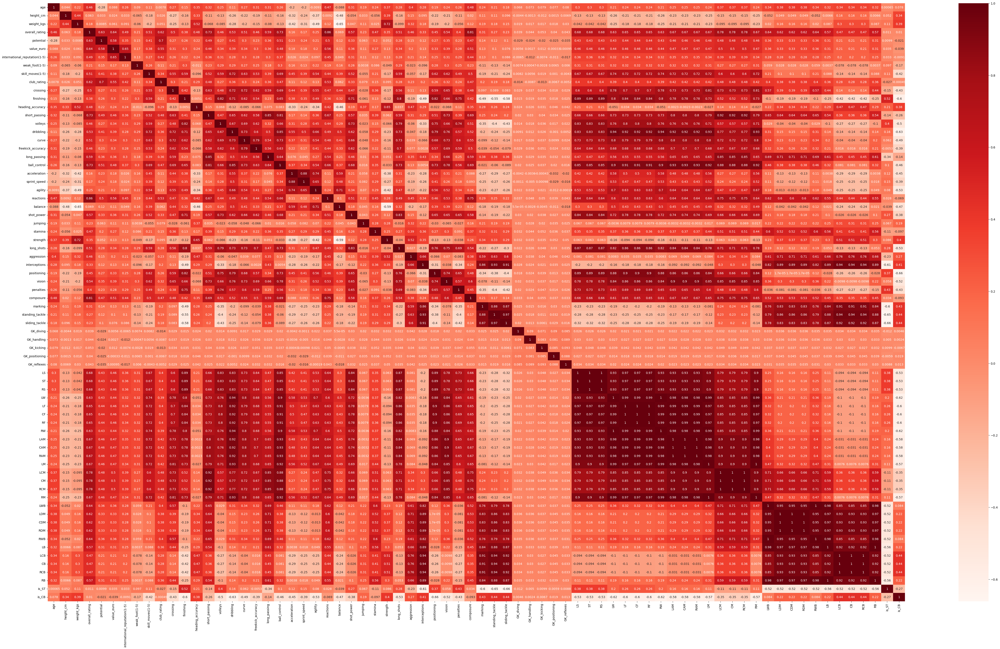

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt

def display_corr_matrix(df):
    plt.figure(figsize=(64, 36))
    index = list(df.columns).index('is_LW')
    corr = df[df.columns[:index]].corr()
    sns.heatmap(corr, cmap='Reds', annot=True)

display_corr_matrix(df)

#### First, let’s exclude strictly linearly dependent features

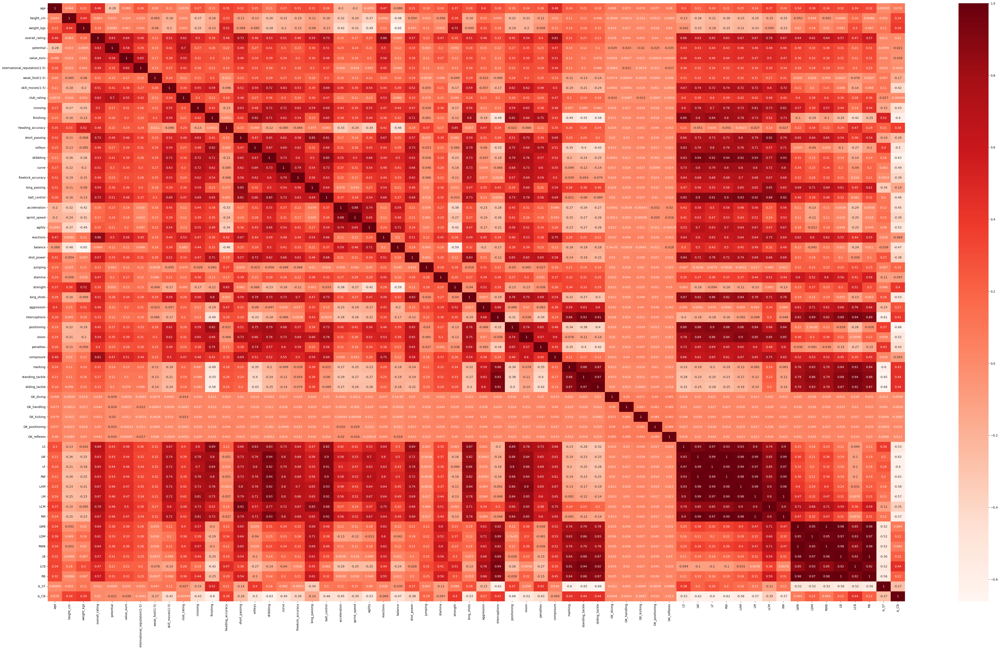

In [22]:
df = df.drop(['ST', 'RS', 'CF', 'RF', 'CAM', 'RAM', 'CM', 'RCM', 'CDM', 'RDM', 'CB', 'RCB'], axis=1)
display_corr_matrix(df)

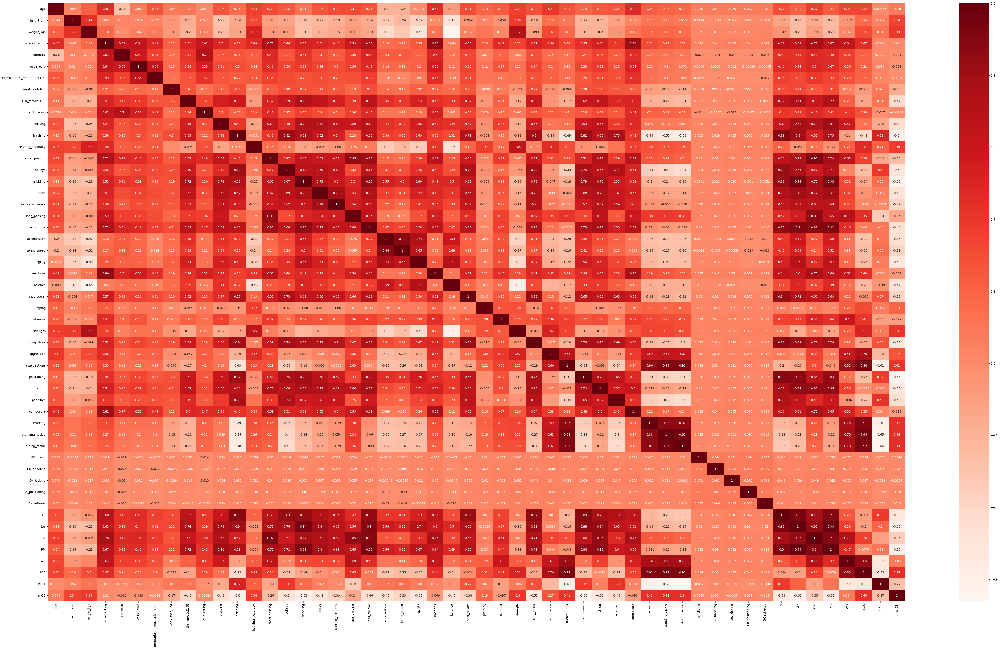

In [23]:
df = df.drop(['LF', 'RW', 'LAM', 'LM', 'LDM', 'RWB', 'LB', 'RB'], axis=1)
display_corr_matrix(df)

#### Then we will eliminate multicollinearity with correlation coefficients of at least 0.93

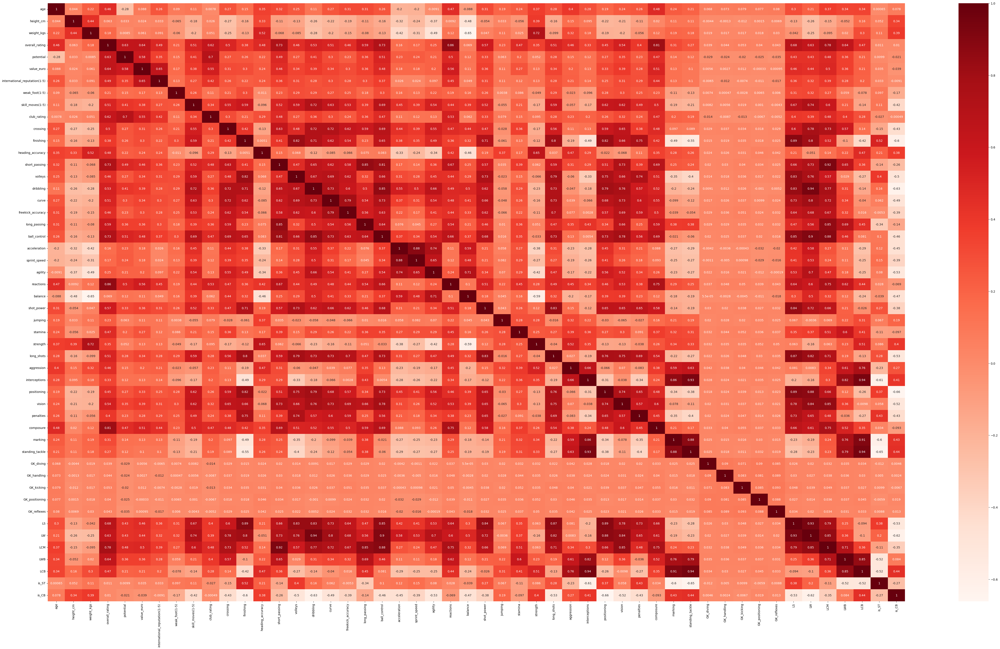

In [24]:
df = df.drop(['RM', 'sliding_tackle'], axis=1)
display_corr_matrix(df)

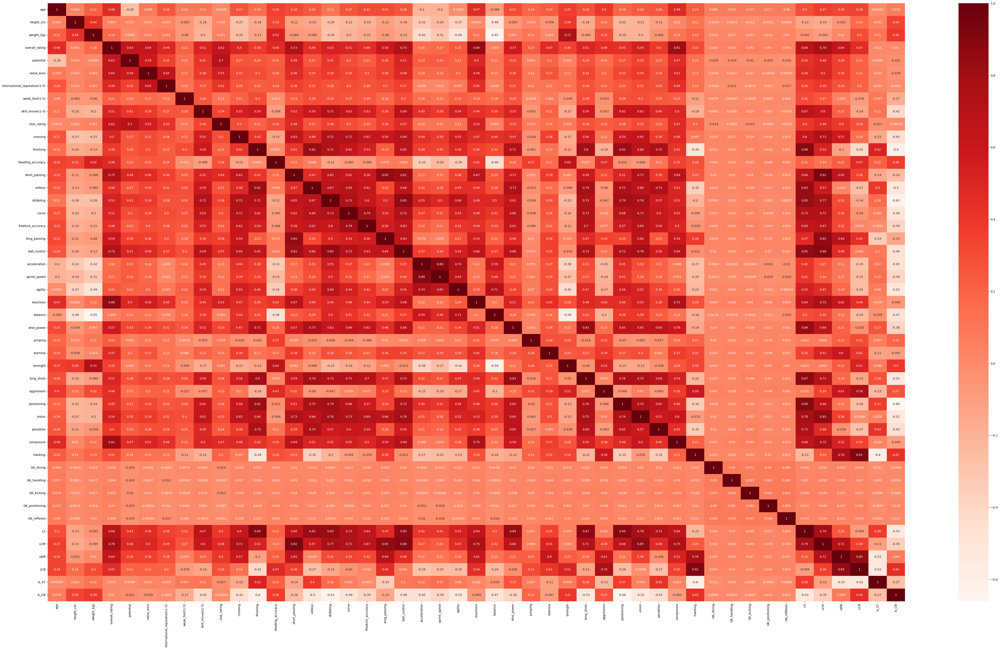

In [25]:
df = df.drop(['LW', 'interceptions', 'standing_tackle'], axis=1)
display_corr_matrix(df)

In [26]:
df.shape

(15675, 133)

In [27]:
import optuna
import numpy as np
import sklearn.cluster
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from datetime import datetime

X = df.drop(['name', 'full_name'], axis=1)
test_results = pd.read_csv('data.csv', sep='\t')

In [28]:
def test_model(name, model, X, objective, n_trials):
    study = optuna.create_study(direction='maximize')
    start = datetime.now()
    study.optimize(objective, n_trials=n_trials)

    ml = model(**study.best_params).fit(X)
    sil_score = silhouette_score(X, ml.labels_)
    davies_score = davies_bouldin_score(X, ml.labels_)
    calinski_score = calinski_harabasz_score(X, ml.labels_)

    return {
        'name': name, 
        'silhouette_score': sil_score, 
        'davies_bouldin_score': davies_score, 
        'calinski_harabasz_score': calinski_score,
        'time': str(datetime.now() - start)
    }

In [29]:
def pca_data(data, n_components):
    if n_components is None:
        return data
    data = data.values
    data = StandardScaler().fit_transform(data)
    
    pca = PCA(n_components=n_components)
    
    principal_components = pca.fit_transform(X)
    
    principal_df = pd.DataFrame(data=principal_components, columns=[str(i) for i in range(n_components)])

    return principal_df

## sklearn.KMeans

In [31]:
def objective(trial):
    n_clusters = trial.suggest_int('n_clusters', 2, 100)
    init = trial.suggest_categorical('init', ['k-means++', 'random'])
    max_iter = trial.suggest_int('max_iter', 100, 1000)
    tol = trial.suggest_float('tol', 1e-8, 1e-1)
    
    model = sklearn.cluster.KMeans(n_clusters=n_clusters, init=init, max_iter=max_iter, tol=tol, random_state=42)
    model.fit(X)

    if len(set(model.labels_)) == 1:
        return 0
    score = calinski_harabasz_score(X, model.labels_)
    return score

for n_components in [None, 10, 30, 50, 70, 100]:
    results = test_model(f'sklearn.KMeans PCA {n_components}', sklearn.cluster.KMeans, pca_data(X, n_components), objective, 10)
    test_results = test_results.append(results, ignore_index=True)

[I 2024-05-01 14:40:03,892] A new study created in memory with name: no-name-80729dff-9085-4b7c-b389-8db178d786b8
[I 2024-05-01 14:40:07,261] Trial 0 finished with value: 38507.67577165328 and parameters: {'n_clusters': 53, 'init': 'random', 'max_iter': 710, 'tol': 0.06423783516979649}. Best is trial 0 with value: 38507.67577165328.
[I 2024-05-01 14:40:07,643] Trial 1 finished with value: 465178.2186164225 and parameters: {'n_clusters': 50, 'init': 'k-means++', 'max_iter': 391, 'tol': 0.0590927521428269}. Best is trial 1 with value: 465178.2186164225.
[I 2024-05-01 14:40:10,608] Trial 2 finished with value: 28078.476758982833 and parameters: {'n_clusters': 31, 'init': 'random', 'max_iter': 288, 'tol': 0.06444385639969992}. Best is trial 1 with value: 465178.2186164225.
[I 2024-05-01 14:40:11,357] Trial 3 finished with value: 1346108.1003508207 and parameters: {'n_clusters': 90, 'init': 'k-means++', 'max_iter': 972, 'tol': 0.06964286011776435}. Best is trial 3 with value: 1346108.100350

In [32]:
test_results

,name,silhouette_score,davies_bouldin_score,calinski_harabasz_score,time
0,sklearn.KMeans PCA None,0.631981,0.317638,1.324444e+06,0:00:16.531797
1,sklearn.KMeans PCA 10,0.622871,0.292095,1.469607e+06,0:00:08.203346
2,sklearn.KMeans PCA 30,0.612709,0.341880,1.022323e+06,0:00:12.092091
3,sklearn.KMeans PCA 50,0.557339,0.468691,1.867315e+05,0:00:14.821142
4,sklearn.KMeans PCA 70,0.601835,0.337491,1.145540e+06,0:00:13.651709
5,sklearn.KMeans PCA 100,0.613747,0.315203,1.313312e+06,0:00:11.513836


## My KMeans

In [34]:
import my_kmeans

def objective(trial):
    n_clusters = trial.suggest_int('n_clusters', 2, 20)
    max_iter = trial.suggest_int('max_iter', 100, 300)
    tol = trial.suggest_float('tol', 1e-8, 1e-1)
    
    model = my_kmeans.KMeans(n_clusters=n_clusters, max_iter=max_iter, tol=tol)
    model.fit(X)
    if len(set(model.labels_)) == 1:
        return 0
    score = calinski_harabasz_score(X, model.labels_)
    return score

for n_components in [None, 10, 30, 50, 70, 100]:
    results = test_model(f'my.KMeans PCA {n_components}', my_kmeans.KMeans, pca_data(X, n_components), objective, 5)
    test_results = test_results.append(results, ignore_index=True)

[I 2024-05-01 14:42:51,051] A new study created in memory with name: no-name-9c667c66-eb16-4977-976c-59b27408fefb
[I 2024-05-01 14:43:27,784] Trial 0 finished with value: 44978.44880921711 and parameters: {'n_clusters': 10, 'max_iter': 212, 'tol': 0.02500390941501215}. Best is trial 0 with value: 44978.44880921711.
[I 2024-05-01 14:43:55,629] Trial 1 finished with value: 51715.39940461007 and parameters: {'n_clusters': 6, 'max_iter': 156, 'tol': 0.06021304106180124}. Best is trial 1 with value: 51715.39940461007.
[I 2024-05-01 14:44:54,010] Trial 2 finished with value: 48975.914586383355 and parameters: {'n_clusters': 17, 'max_iter': 223, 'tol': 0.08372643005895972}. Best is trial 1 with value: 51715.39940461007.
[I 2024-05-01 14:45:28,158] Trial 3 finished with value: 29274.47087983121 and parameters: {'n_clusters': 18, 'max_iter': 279, 'tol': 0.06908441987084644}. Best is trial 1 with value: 51715.39940461007.
[I 2024-05-01 14:46:02,855] Trial 4 finished with value: 52547.48901710044

In [30]:
test_results

,name,silhouette_score,davies_bouldin_score,calinski_harabasz_score,time
0,sklearn.KMeans PCA None,0.631981,0.317638,1324444.00,0:00:16.531797
1,sklearn.KMeans PCA 10,0.622871,0.292095,1469607.00,0:00:08.203346
2,sklearn.KMeans PCA 30,0.612709,0.341880,1022323.00,0:00:12.092091
3,sklearn.KMeans PCA 50,0.557339,0.468691,186731.50,0:00:14.821142
4,sklearn.KMeans PCA 70,0.601835,0.337491,1145540.00,0:00:13.651709
5,sklearn.KMeans PCA 100,0.613747,0.315203,1313312.00,0:00:11.513836
6,my.KMeans PCA None,0.696895,0.520751,52547.49,0:03:50.266653
7,my.KMeans PCA 10,0.696895,0.520751,52547.49,0:04:22.402663
8,my.KMeans PCA 30,0.732523,0.499978,51715.40,0:03:56.911870
9,my.KMeans PCA 50,0.732523,0.499978,51715.40,0:02:46.720747


## sklearn.DBSCAN

In [31]:
def objective(trial):
    min_samples = trial.suggest_int('min_samples', 5, 30)
    leaf_size = trial.suggest_int('leaf_size', 10, 30)
    eps = trial.suggest_float('eps', 1e-4, 1e5)
    algorithm = trial.suggest_categorical('algorithm', ['ball_tree', 'kd_tree', 'brute'])
    
    model = sklearn.cluster.DBSCAN(min_samples=min_samples, leaf_size=leaf_size, eps=eps, algorithm=algorithm)
    model.fit(X)

    if len(set(model.labels_)) == 1:
        return 0
    score = calinski_harabasz_score(X, model.labels_)
    return score

for n_components in [None, 10, 30, 50, 70, 100]:
    results = test_model(f'sklearn.DBSCAN PCA {n_components}', sklearn.cluster.DBSCAN, pca_data(X, n_components), objective, 15)
    test_results = test_results.append(results, ignore_index=True)

[I 2024-05-01 15:15:08,344] A new study created in memory with name: no-name-9acaaf96-3ebc-4650-9ebb-84e6c6978d82
[I 2024-05-01 15:15:09,967] Trial 0 finished with value: 1150.0074170344608 and parameters: {'min_samples': 16, 'leaf_size': 15, 'eps': 90325.603879635, 'algorithm': 'brute'}. Best is trial 0 with value: 1150.0074170344608.
[I 2024-05-01 15:15:12,538] Trial 1 finished with value: 1503.2917484416655 and parameters: {'min_samples': 7, 'leaf_size': 30, 'eps': 91844.85158278045, 'algorithm': 'kd_tree'}. Best is trial 1 with value: 1503.2917484416655.
[I 2024-05-01 15:15:13,117] Trial 2 finished with value: 1354.9622837541806 and parameters: {'min_samples': 9, 'leaf_size': 30, 'eps': 91388.06056537466, 'algorithm': 'ball_tree'}. Best is trial 1 with value: 1503.2917484416655.
[I 2024-05-01 15:15:13,641] Trial 3 finished with value: 1354.9622837541806 and parameters: {'min_samples': 9, 'leaf_size': 22, 'eps': 61726.031390289376, 'algorithm': 'ball_tree'}. Best is trial 1 with val

In [32]:
test_results

,name,silhouette_score,davies_bouldin_score,calinski_harabasz_score,time
0,sklearn.KMeans PCA None,0.631981,0.317638,1.324444e+06,0:00:16.531797
1,sklearn.KMeans PCA 10,0.622871,0.292095,1.469607e+06,0:00:08.203346
2,sklearn.KMeans PCA 30,0.612709,0.341880,1.022323e+06,0:00:12.092091
3,sklearn.KMeans PCA 50,0.557339,0.468691,1.867315e+05,0:00:14.821142
4,sklearn.KMeans PCA 70,0.601835,0.337491,1.145540e+06,0:00:13.651709
5,sklearn.KMeans PCA 100,0.613747,0.315203,1.313312e+06,0:00:11.513836
6,my.KMeans PCA None,0.696895,0.520751,5.254749e+04,0:03:50.266653
7,my.KMeans PCA 10,0.696895,0.520751,5.254749e+04,0:04:22.402663
8,my.KMeans PCA 30,0.732523,0.499978,5.171540e+04,0:03:56.911870
9,my.KMeans PCA 50,0.732523,0.499978,5.171540e+04,0:02:46.720747


In [48]:
from sklearn.manifold import TSNE

def display_clusterization(model, parameters, data, title):
    data['cluster'] = model(**parameters).fit(data).labels_
    column_names = data.columns.difference(['cluster'])
    X = data[column_names]
    
    pca = PCA(n_components=5)
    X_pca = pca.fit_transform(X)
    
    tsne = TSNE(n_components=2, random_state=42)
    X_tsne = tsne.fit_transform(X_pca)
    
    tsne_df = pd.DataFrame(X_tsne, columns=['TSNE1', 'TSNE2'])
    
    tsne_df['cluster'] = data['cluster'].values
    
    plt.figure(figsize=(10, 8))
    sns.scatterplot(x='TSNE1', y='TSNE2', hue='cluster', data=tsne_df, palette='viridis', legend='full')
    plt.title(title)
    plt.show()

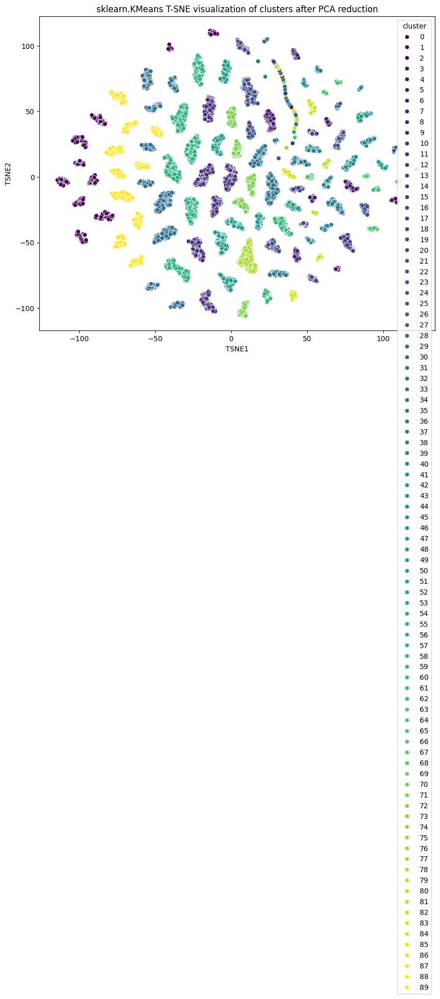

In [49]:
display_clusterization(
    sklearn.cluster.KMeans,
    {'n_clusters': 90, 'init': 'k-means++', 'max_iter': 972, 'tol': 0.06964286011776435},
    data, 
    'sklearn.KMeans T-SNE visualization of clusters after PCA reduction'
)

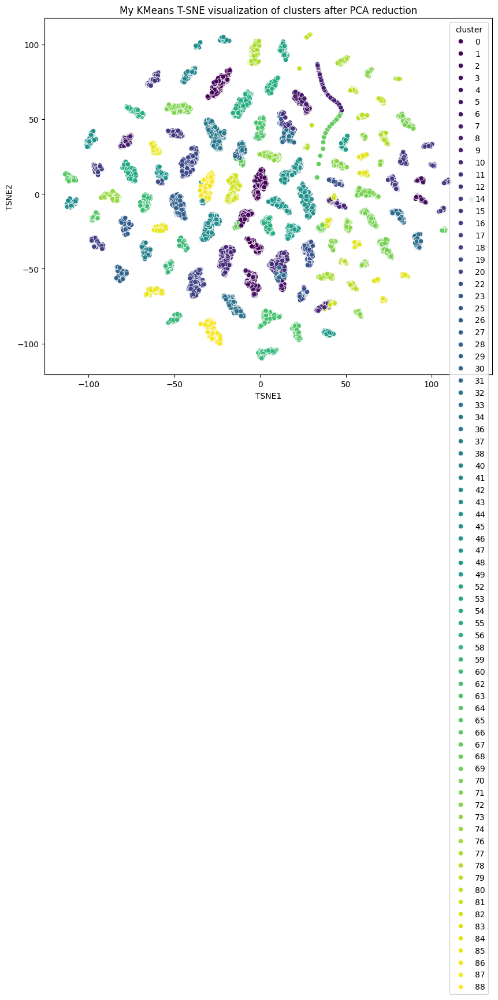

In [121]:
import my_kmeans
display_clusterization(
    my_kmeans.KMeans,
    {'n_clusters': 90, 'max_iter': 142, 'tol': 0.08819452497345187},
    data,
    'My KMeans T-SNE visualization of clusters after PCA reduction'
)

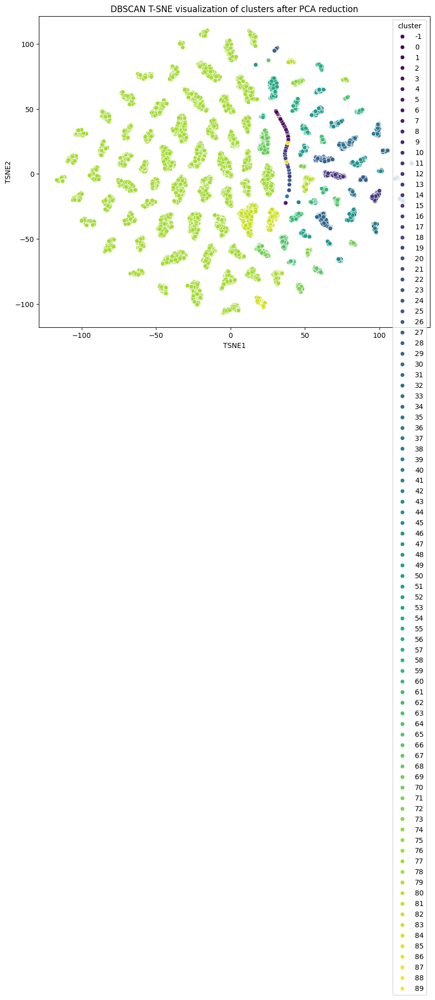

In [115]:
display_clusterization(
    sklearn.cluster.DBSCAN,
    {'min_samples': 5, 'leaf_size': 27, 'eps': 89659.31249969496, 'algorithm': 'kd_tree'},
    data, 
    'DBSCAN T-SNE visualization of clusters after PCA reduction'
)

### We can draw the following conclusion: the clustering problem is very complex and its solution must be tailored to each specific case.

### For our data in general, we can say that all algorithms performed well, showing the best results on a number of clusters close to the number of the clusters of FIFA players by overall rating (in FIFA, all players are assigned an overall rating from 0 to 100). However, my implementation of the KMeans algorithm was slow, so it is best to use optimized sklearn implementations